In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.preprocessing import StandardScaler
import os
from sklearn.metrics import mean_squared_error
import math
import numpy as np
import os
import pandas as pd
import pyproj
from math import cos, radians
import rasterio
from rasterio.windows import from_bounds

In [2]:
# ====== CONFIGURATION ======
map_file = 'data/raw/Lunar_LRO_LROC-WAC_Mosaic_global_100m_June2013.tif'  # UPDATE THIS PATH!
crater_info_path = 'data/processed_new/cae/metadata.csv'
offset = 0.5

In [3]:
# ====== HELPER FUNCTIONS ======
def get_craters_crs():
    craters_wkt = """
        GEOGCS["GCS_Moon",
        DATUM["D_Moon_2000",
        SPHEROID["Moon_2000_IAU_IAG",1737151.3,0, LENGTHUNIT["metre",1]]],
        PRIMEM["Reference_Meridian",0],
        UNIT["metre",1]],
        PROJECTION["Equirectangular"],
        PARAMETER["standard_parallel_1",0],
        PARAMETER["central_meridian",0],
        PARAMETER["false_easting",0],
        PARAMETER["false_northing",0],
        UNIT["metre",1, AUTHORITY["EPSG","9001"]],
        AXIS["Easting",EAST],
        AXIS["Northing",NORTH],
        AUTHORITY["ESRI","103881"]]
    """
    return pyproj.CRS.from_wkt(craters_wkt)

def crop_crater_raw(map_ref, lat, lon, diameter, offset, transformer):
    """Extract RAW crater from mosaic - NO processing"""
    if lon > 180:
        lon -= 360
    
    x, y = transformer.transform(lon, lat)
    
    radius = (diameter / 2) * 1000
    radius_with_offset_x = (radius + radius * offset) / cos(radians(lat))
    radius_with_offset_y = radius + radius * offset
    min_x, min_y = x - radius_with_offset_x, y - radius_with_offset_y
    max_x, max_y = x + radius_with_offset_x, y + radius_with_offset_y

    window = from_bounds(min_x, min_y, max_x, max_y, transform=map_ref.transform)
    cropped_image = map_ref.read(window=window)
    
    if cropped_image.ndim == 3:
        cropped_image = cropped_image[0]
    
    return cropped_image


In [19]:
# 1. Load data via memmap
file_path = "data/processed/cae/craters.npy"
file_size = os.path.getsize(file_path)
N_total = file_size // (224 * 224 * 1 * 4)
data = np.memmap(
    file_path,
    dtype=np.float32,
    mode="r",
    shape=(N_total, 1, 224, 224)
)

# 2. Sample what you need
n_samples = 50000
random_seed = 42 

np.random.seed(random_seed)
pca_sample_indices = np.random.choice(N_total, size=n_samples, replace=False)

print(f"Sampling {n_samples} craters with random seed {random_seed}")
print(f"Sample indices shape: {pca_sample_indices.shape}")

# 3. Load to CPU and reshape
print(f"Loading {n_samples} samples...")
X = data[pca_sample_indices].reshape(n_samples, -1)

# 4. Standardize
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 5. PCA with randomized solver (fast and memory efficient)
from sklearn.decomposition import PCA
n_comp = 50
print(f"Running PCA...")
pca = PCA(n_components=n_comp, svd_solver='randomized')
X_pca = pca.fit_transform(X_scaled)

print(f"PCA complete!")
print(f"Shape: {X_pca.shape}")
print(f"Variance captured: {pca.explained_variance_ratio_.sum():.2%}")

Sampling 50000 craters with random seed 42
Sample indices shape: (50000,)
Loading 50000 samples...
Running PCA...
PCA complete!
Shape: (50000, 50)
Variance captured: 96.96%


In [5]:
# 4. Visualize Reconstruction of specific components (Eigen-craters)
def plot_pca_components(pca, original_shape, n_to_show=10):
    """
    Shows the 'Eigen-craters' in rows of 5.
    These are the templates PCA uses to reconstruct your images.
    """
    cols = 5
    rows = math.ceil(n_to_show / cols)
    
    plt.figure(figsize=(15, 3 * rows))
    
    for i in range(min(n_to_show, len(pca.components_))):
        plt.subplot(rows, cols, i + 1)
        
        # Reshape the flat vector back to 224x224
        component_img = pca.components_[i].reshape(original_shape)
        
        # Use 'gray' and center the colorbar around 0
        # Components have positive and negative values
        plt.imshow(component_img, cmap='gray')
        
        plt.title(f"PC {i+1}\nVar: {pca.explained_variance_ratio_[i]:.2%}")
        plt.axis('off')
    
    plt.suptitle("Principal Components: The 'Templates' of your Crater Data", y=1.02, fontsize=16)
    plt.tight_layout()
    plt.show()

def compare_reconstruction(X_scaled, X_pca, pca, scaler, original_shape, n_examples=5, random_seed=None):
    """
    Visualizes original vs reconstructed craters and calculates pixel-wise error.
    Randomly selects examples from the dataset.
    
    Parameters:
    -----------
    random_seed : int, optional
        Random seed for reproducibility. If None, examples will be different each time.
    """
    import numpy as np
    from sklearn.metrics import mean_squared_error
    import matplotlib.pyplot as plt
    
    # Randomly select indices
    if random_seed is not None:
        np.random.seed(random_seed)
    n_total = X_scaled.shape[0]
    random_indices = np.random.choice(n_total, size=n_examples, replace=False)
    
    # Inverse transform to get back to original pixel space
    X_reconstructed_scaled = pca.inverse_transform(X_pca)
    X_reconstructed = scaler.inverse_transform(X_reconstructed_scaled)
    X_original = scaler.inverse_transform(X_scaled)

    plt.figure(figsize=(15, 7))
    
    for plot_idx, data_idx in enumerate(random_indices):
        # Calculate MSE for this specific image
        mse_val = mean_squared_error(X_original[data_idx], X_reconstructed[data_idx])
        
        # 1. Original Image (Top Row)
        plt.subplot(2, n_examples, plot_idx + 1)
        plt.imshow(X_original[data_idx].reshape(original_shape), cmap='gray')
        plt.title(f"Original {data_idx}")
        plt.axis('off')

        # 2. Reconstructed Image (Bottom Row)
        plt.subplot(2, n_examples, plot_idx + 1 + n_examples)
        plt.imshow(X_reconstructed[data_idx].reshape(original_shape), cmap='gray')
        # Display variance explained and MSE
        variance_explained = pca.explained_variance_ratio_.sum()
        plt.title(f"{pca.n_components_} comp ({variance_explained:.1%})\nMSE: {mse_val:.4f}")
        plt.axis('off')
        
    plt.suptitle(f"PCA Reconstruction: {pca.n_components_} Components Retained", fontsize=16)
    plt.tight_layout()
    plt.show()


def compare_reconstruction_progressive(X_scaled, X_pca, pca, scaler, original_shape, 
                                       n_examples=5, component_levels=None, random_seed=None):
    """
    Shows how reconstruction quality improves with 1, 2, 5, 10, 20, etc. components.
    Randomly selects examples from the dataset.
    
    Parameters:
    -----------
    component_levels : list of int, optional
        List of component counts to compare (e.g., [1, 2, 5, 10, 20, 50, 100])
        If None, uses [1, 2, 5, 10, 20, 50, 100, 200, pca.n_components_]
    random_seed : int, optional
        Random seed for reproducibility. If None, examples will be different each time.
    """
    from sklearn.metrics import mean_squared_error
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Randomly select indices
    if random_seed is not None:
        np.random.seed(random_seed)
    n_total = X_scaled.shape[0]
    random_indices = np.random.choice(n_total, size=n_examples, replace=False)
    
    # Default component levels if not provided
    if component_levels is None:
        max_components = pca.n_components_
        component_levels = [1, 2, 5, 10, 20, 50, 100, 200, max_components]
        # Filter out values greater than max_components and remove duplicates
        component_levels = sorted(set([c for c in component_levels if c <= max_components]))
    
    # Get original images (unstandardized) - only for selected indices
    X_original = scaler.inverse_transform(X_scaled)
    
    # Create figure
    n_rows = len(component_levels) + 1  # +1 for original row
    fig, axes = plt.subplots(n_rows, n_examples, figsize=(3*n_examples, 3*n_rows))
    
    # Ensure axes is 2D
    if n_examples == 1:
        axes = axes.reshape(-1, 1)
    
    # Plot original images in first row
    for plot_idx, data_idx in enumerate(random_indices):
        ax = axes[0, plot_idx]
        ax.imshow(X_original[data_idx].reshape(original_shape), cmap='gray')
        ax.set_title(f"Original {data_idx}", fontsize=10)
        ax.axis('off')
    
    # Plot reconstructions for each component level
    for row_idx, n_comp in enumerate(component_levels, start=1):
        # Reconstruct using only first n_comp components
        X_pca_truncated = X_pca[:, :n_comp]
        components_truncated = pca.components_[:n_comp, :]
        mean = pca.mean_
        
        # Manual reconstruction: X_reconstructed = X_pca @ components + mean
        X_reconstructed_scaled = X_pca_truncated @ components_truncated + mean
        X_reconstructed = scaler.inverse_transform(X_reconstructed_scaled)
        
        # Calculate variance explained by these components
        variance_explained = pca.explained_variance_ratio_[:n_comp].sum()
        
        for plot_idx, data_idx in enumerate(random_indices):
            ax = axes[row_idx, plot_idx]
            
            # Calculate MSE for this image
            mse_val = mean_squared_error(X_original[data_idx], X_reconstructed[data_idx])
            
            # Plot reconstructed image
            ax.imshow(X_reconstructed[data_idx].reshape(original_shape), cmap='gray')
            ax.set_title(f"{n_comp} comp\nVar: {variance_explained:.1%}\nMSE: {mse_val:.4f}", 
                        fontsize=9)
            ax.axis('off')
    
    plt.suptitle(f"PCA Reconstruction Quality vs Number of Components", fontsize=14, y=0.995)
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics (using only the random examples)
    print(f"\nReconstruction Summary (based on {n_examples} random samples):")
    print(f"{'Components':<12} {'Variance':<12} {'Avg MSE':<12}")
    print("-" * 36)
    
    for n_comp in component_levels:
        X_pca_truncated = X_pca[random_indices, :n_comp]
        components_truncated = pca.components_[:n_comp, :]
        X_reconstructed_scaled = X_pca_truncated @ components_truncated + pca.mean_
        X_reconstructed = scaler.inverse_transform(X_reconstructed_scaled)
        
        X_original_subset = X_original[random_indices]
        avg_mse = np.mean([mean_squared_error(X_original_subset[i], X_reconstructed[i]) 
                           for i in range(n_examples)])
        variance_explained = pca.explained_variance_ratio_[:n_comp].sum()
        
        print(f"{n_comp:<12} {variance_explained:<12.2%} {avg_mse:<12.6f}")

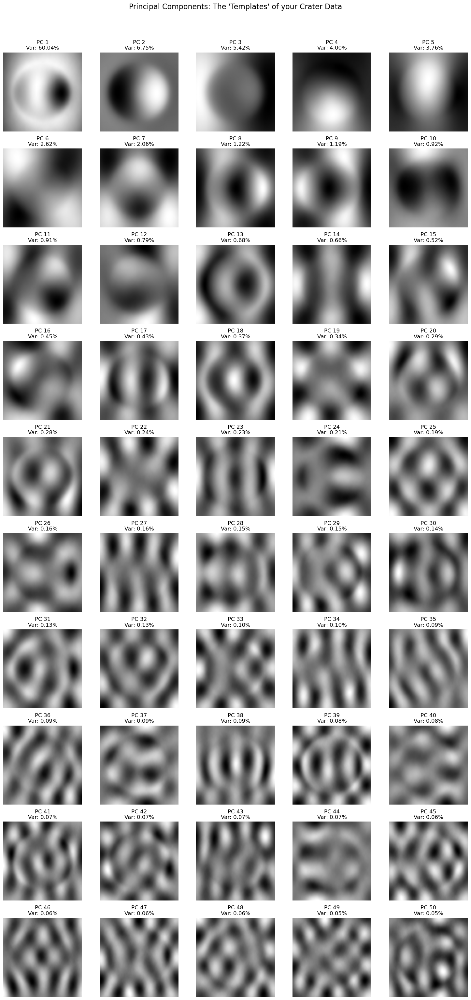

In [21]:
# Define the original image shape
original_shape = (224, 224)
plot_pca_components(pca, original_shape,50)


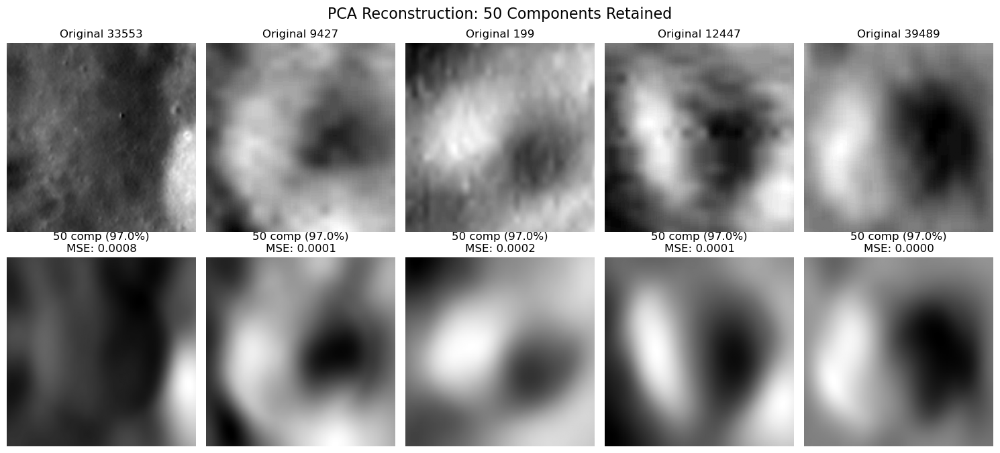

In [22]:
# 2. With random examples but reproducible (same examples each time)
compare_reconstruction(X_scaled, X_pca, pca, scaler, (224, 224), n_examples=5, random_seed=42)


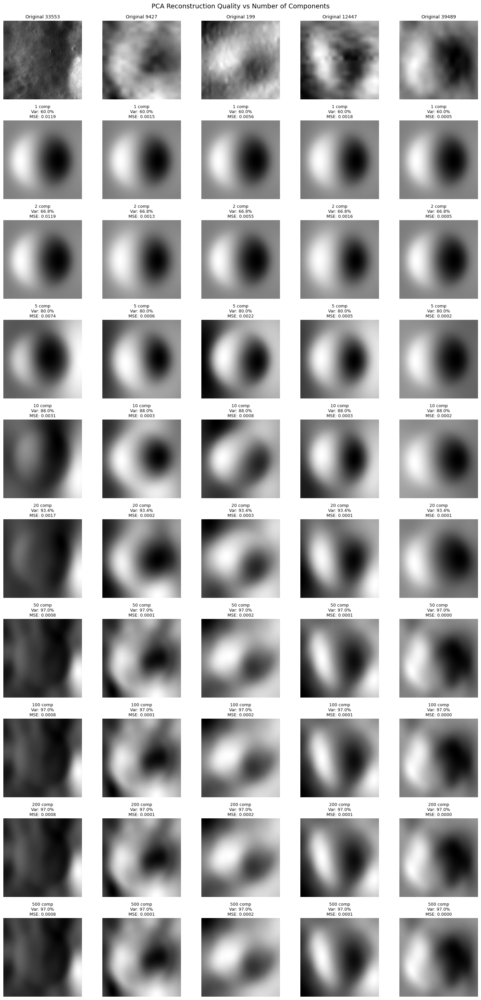


Reconstruction Summary (based on 5 random samples):
Components   Variance     Avg MSE     
------------------------------------
1            60.04%       0.004249    
2            66.79%       0.004139    
5            79.97%       0.002183    
10           87.99%       0.000929    
20           93.42%       0.000466    
50           96.96%       0.000232    
100          96.96%       0.000232    
200          96.96%       0.000232    
500          96.96%       0.000232    


In [23]:
# 3. Progressive reconstruction with random examples
compare_reconstruction_progressive(X_scaled, X_pca, pca, scaler, (224, 224), 
                                   n_examples=5, 
                                   component_levels=[1, 2, 5, 10, 20, 50, 100, 200, 500],
                                   random_seed=42)

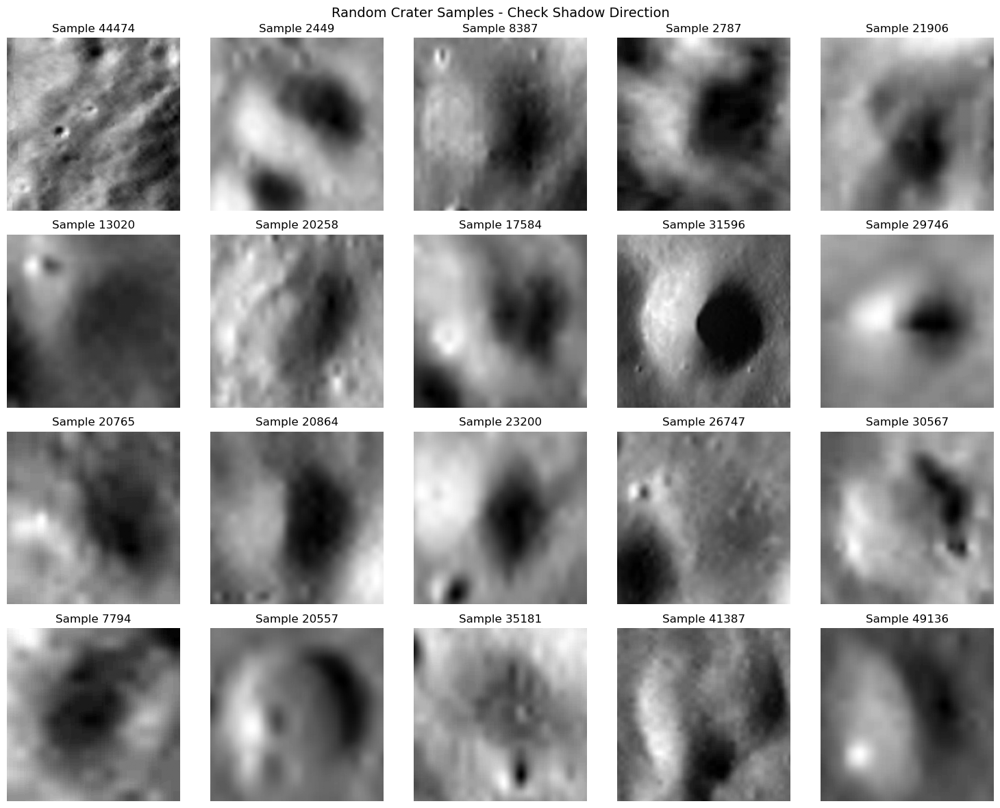


=== HIGH PC2 CRATERS ===
PCA indices: [37732 17334 12973 33715 23308]
Original data indices: [306485 240529 658241 161670 678004]

=== LOW PC2 CRATERS ===
PCA indices: [38931 13852 14969  4295  7592]
Original data indices: [133521   9095  76763 136415 415540]


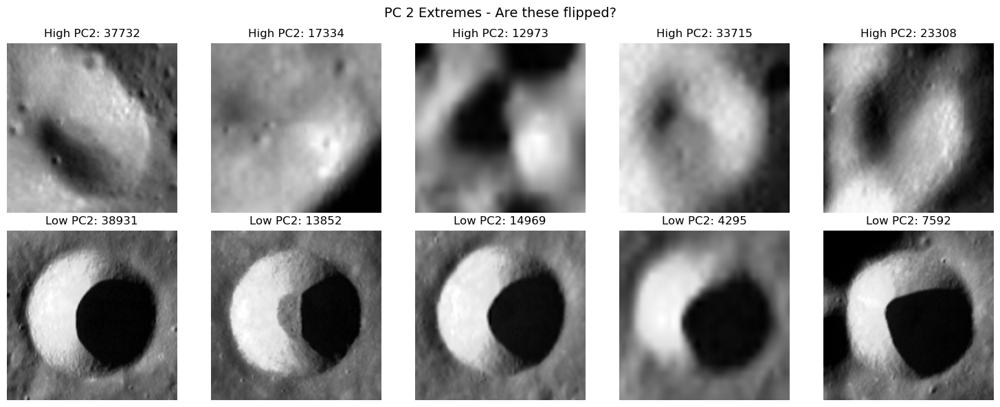

In [24]:
# Check if you have any left-right flipped craters in your data
import numpy as np
import matplotlib.pyplot as plt

# Get original (unstandardized) images
X_original = scaler.inverse_transform(X_scaled)

# Look at some random samples
n_check = 20
random_indices = np.random.choice(X_original.shape[0], size=n_check, replace=False)

fig, axes = plt.subplots(4, 5, figsize=(15, 12))
axes = axes.flatten()

for i, idx in enumerate(random_indices):
    img = X_original[idx].reshape(224, 224)
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(f"Sample {idx}")
    axes[i].axis('off')

plt.suptitle("Random Crater Samples - Check Shadow Direction", fontsize=14)
plt.tight_layout()
plt.show()

# Also check: Look at extreme examples along PC 2
# Images with high positive PC 2 scores vs high negative PC 2 scores
pc2_scores = X_pca[:, 1]  # PC 2 is index 1

n_extremes = 5
high_pc2_pca_idx = np.argsort(pc2_scores)[-n_extremes:]  # Indices into PCA sample
low_pc2_pca_idx = np.argsort(pc2_scores)[:n_extremes]    # Indices into PCA sample

high_pc2_data_idx = pca_sample_indices[high_pc2_pca_idx]
low_pc2_data_idx = pca_sample_indices[low_pc2_pca_idx]

print("\n=== HIGH PC2 CRATERS ===")
print("PCA indices:", high_pc2_pca_idx)
print("Original data indices:", high_pc2_data_idx)

print("\n=== LOW PC2 CRATERS ===")
print("PCA indices:", low_pc2_pca_idx)
print("Original data indices:", low_pc2_data_idx)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, idx in enumerate(high_pc2_pca_idx):
    axes[0, i].imshow(X_original[idx].reshape(224, 224), cmap='gray')
    axes[0, i].set_title(f"High PC2: {idx}")
    axes[0, i].axis('off')

for i, idx in enumerate(low_pc2_pca_idx):
    axes[1, i].imshow(X_original[idx].reshape(224, 224), cmap='gray')
    axes[1, i].set_title(f"Low PC2: {idx}")
    axes[1, i].axis('off')

plt.suptitle("PC 2 Extremes - Are these flipped?", fontsize=14)
plt.tight_layout()
plt.show()

Loading crater metadata...
Opening lunar mosaic: data/raw/Lunar_LRO_LROC-WAC_Mosaic_global_100m_June2013.tif

=== Extracting HIGH PC2 craters ===
  306485: 04-1-111361, Lat=57.57°, Diam=4697m
  240529: 03-1-147507, Lat=-54.74°, Diam=2675m
  658241: 07-1-198674, Lat=-51.84°, Diam=1297m
  161670: 03-1-031633, Lat=-10.51°, Diam=2133m
  678004: 07-1-223797, Lat=-58.18°, Diam=4575m

=== Extracting LOW PC2 craters ===
  133521: 02-1-175106, Lat=56.17°, Diam=7796m
  9095: 02-1-013448, Lat=4.01°, Diam=8301m
  76763: 02-1-103698, Lat=29.54°, Diam=5405m
  136415: 02-1-178492, Lat=59.03°, Diam=1435m
  415540: 06-1-000236, Lat=48.52°, Diam=8496m


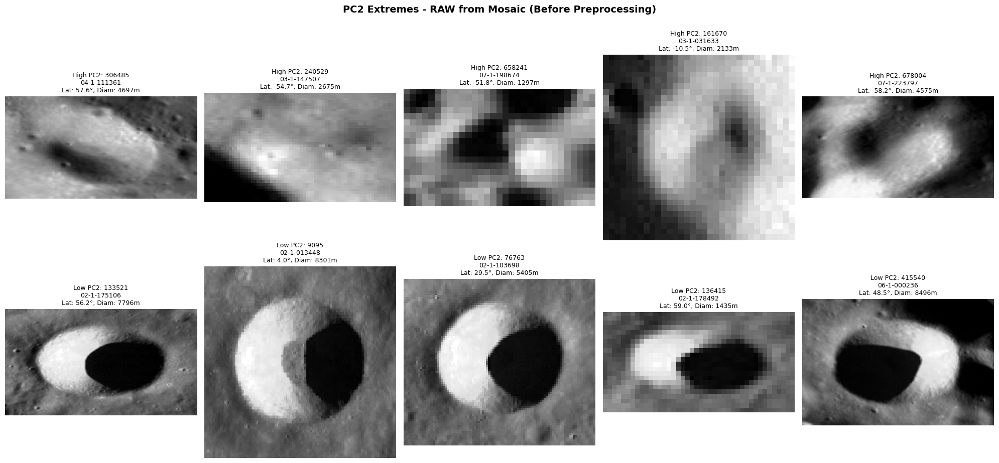


✅ Done!


In [25]:
# ====== LOAD DATA ======
print("Loading crater metadata...")
crater_info = pd.read_csv(crater_info_path)

print(f"Opening lunar mosaic: {map_file}")
craters_crs = get_craters_crs()

# ====== EXTRACT AND DISPLAY ======
with rasterio.open(map_file) as map_ref:
    transformer = pyproj.Transformer.from_crs(
        craters_crs, map_ref.crs.to_string(), always_xy=True
    )
    
    fig, axes = plt.subplots(2, 5, figsize=(20, 10))
    
    # HIGH PC2 craters
    print("\n=== Extracting HIGH PC2 craters ===")
    for i, idx in enumerate(high_pc2_data_idx[:5]):
        crater = crater_info.iloc[idx]
        print(f"  {idx}: {crater['id']}, Lat={crater['lat']:.2f}°, Diam={crater['diam']:.0f}m")
        
        original_img = crop_crater_raw(
            map_ref, 
            crater['lat'], 
            crater['lon'], 
            crater['diam'] / 1000,
            offset, 
            transformer
        )
        
        axes[0, i].imshow(original_img, cmap='gray')
        axes[0, i].set_title(
            f"High PC2: {idx}\n{crater['id']}\n"
            f"Lat: {crater['lat']:.1f}°, Diam: {crater['diam']:.0f}m",
            fontsize=9
        )
        axes[0, i].axis('off')
    
    # LOW PC2 craters
    print("\n=== Extracting LOW PC2 craters ===")
    for i, idx in enumerate(low_pc2_data_idx[:5]):
        crater = crater_info.iloc[idx]
        print(f"  {idx}: {crater['id']}, Lat={crater['lat']:.2f}°, Diam={crater['diam']:.0f}m")
        
        original_img = crop_crater_raw(
            map_ref, 
            crater['lat'], 
            crater['lon'], 
            crater['diam'] / 1000,
            offset, 
            transformer
        )
        
        axes[1, i].imshow(original_img, cmap='gray')
        axes[1, i].set_title(
            f"Low PC2: {idx}\n{crater['id']}\n"
            f"Lat: {crater['lat']:.1f}°, Diam: {crater['diam']:.0f}m",
            fontsize=9
        )
        axes[1, i].axis('off')

plt.suptitle("PC2 Extremes - RAW from Mosaic (Before Preprocessing)", 
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n✅ Done!")

In [4]:
# 1. Load data via memmap
file_path = "data/processed_new/cae/craters.npy"
file_size = os.path.getsize(file_path)
N_total = file_size // (224 * 224 * 1 * 4)
data = np.memmap(
    file_path,
    dtype=np.float32,
    mode="r",
    shape=(N_total, 1, 224, 224)
)

# 2. Sample what you need
n_samples = 50000
random_seed = 42 

np.random.seed(random_seed)
pca_sample_indices = np.random.choice(N_total, size=n_samples, replace=False)

print(f"Sampling {n_samples} craters with random seed {random_seed}")
print(f"Sample indices shape: {pca_sample_indices.shape}")

# 3. Load to CPU and reshape
print(f"Loading {n_samples} samples...")
X = data[pca_sample_indices].reshape(n_samples, -1)

# 4. Standardize
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 5. PCA with randomized solver (fast and memory efficient)
from sklearn.decomposition import PCA
n_comp = 50
print(f"Running PCA...")
pca = PCA(n_components=n_comp, svd_solver='randomized')
X_pca = pca.fit_transform(X_scaled)

print(f"PCA complete!")
print(f"Shape: {X_pca.shape}")
print(f"Variance captured: {pca.explained_variance_ratio_.sum():.2%}")

Sampling 50000 craters with random seed 42
Sample indices shape: (50000,)
Loading 50000 samples...
Running PCA...
PCA complete!
Shape: (50000, 50)
Variance captured: 96.23%


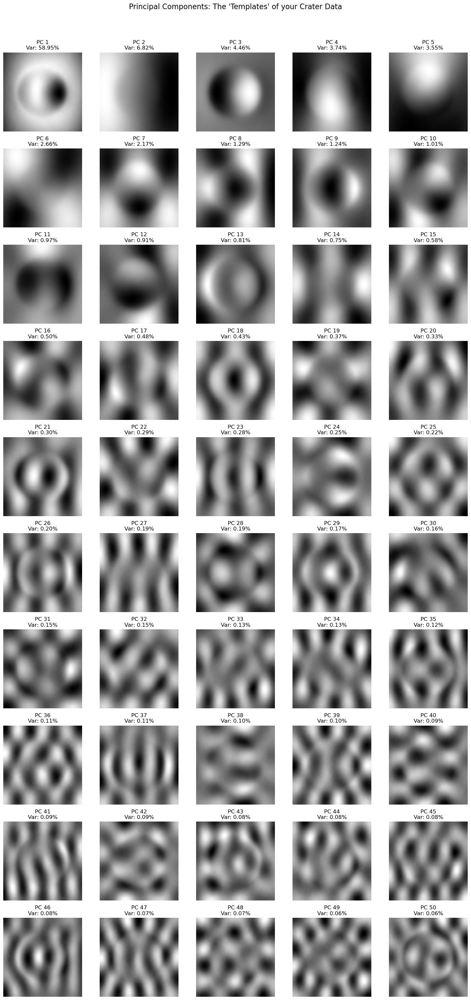

In [6]:
# Define the original image shape
original_shape = (224, 224)
plot_pca_components(pca, original_shape,50)


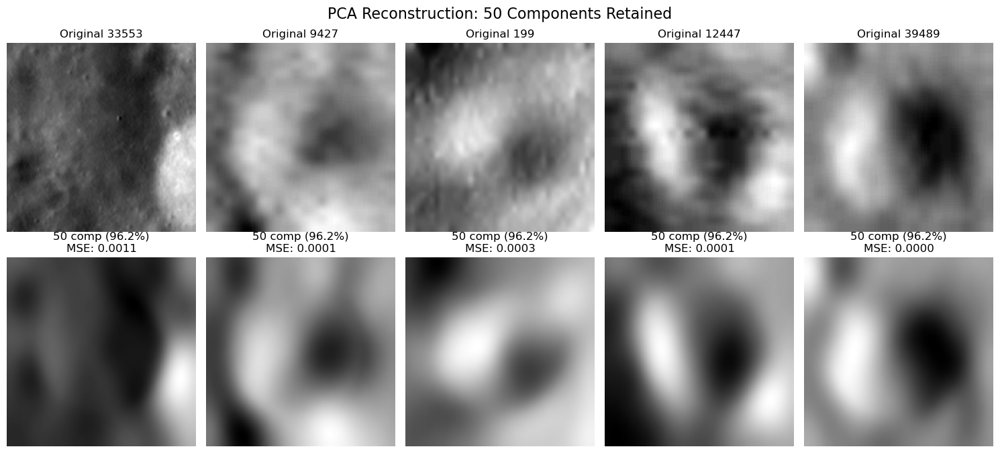

In [7]:
# 2. With random examples but reproducible (same examples each time)
compare_reconstruction(X_scaled, X_pca, pca, scaler, (224, 224), n_examples=5, random_seed=42)


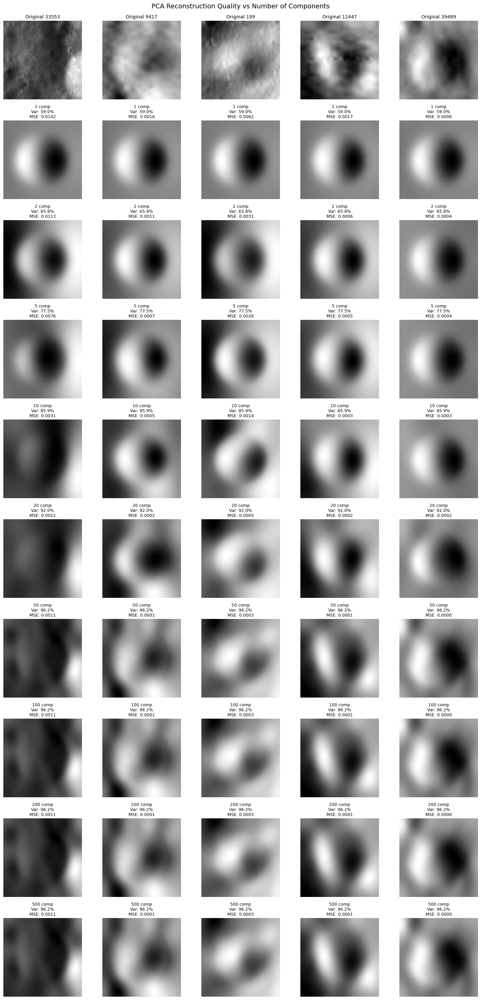


Reconstruction Summary (based on 5 random samples):
Components   Variance     Avg MSE     
------------------------------------
1            58.95%       0.004844    
2            65.77%       0.003283    
5            77.53%       0.002364    
10           85.91%       0.001118    
20           92.03%       0.000650    
50           96.23%       0.000304    
100          96.23%       0.000304    
200          96.23%       0.000304    
500          96.23%       0.000304    


In [8]:
# 3. Progressive reconstruction with random examples
compare_reconstruction_progressive(X_scaled, X_pca, pca, scaler, (224, 224), 
                                   n_examples=5, 
                                   component_levels=[1, 2, 5, 10, 20, 50, 100, 200, 500],
                                   random_seed=42)

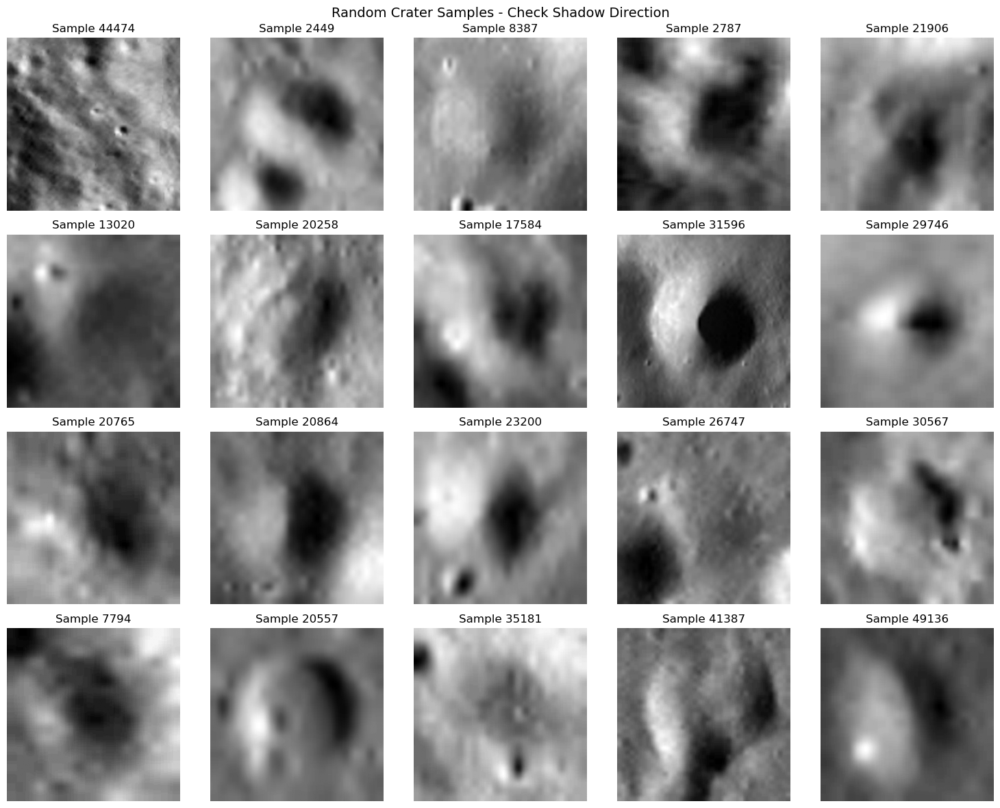


=== HIGH PC3 CRATERS ===
PCA indices: [25111 40817 32686 39852 17693]
Original data indices: [ 22997 588505 605773 667638 919052]

=== LOW PC3 CRATERS ===
PCA indices: [44483  7592 44327 14969 38931]
Original data indices: [546534 415540     51  76763 133521]


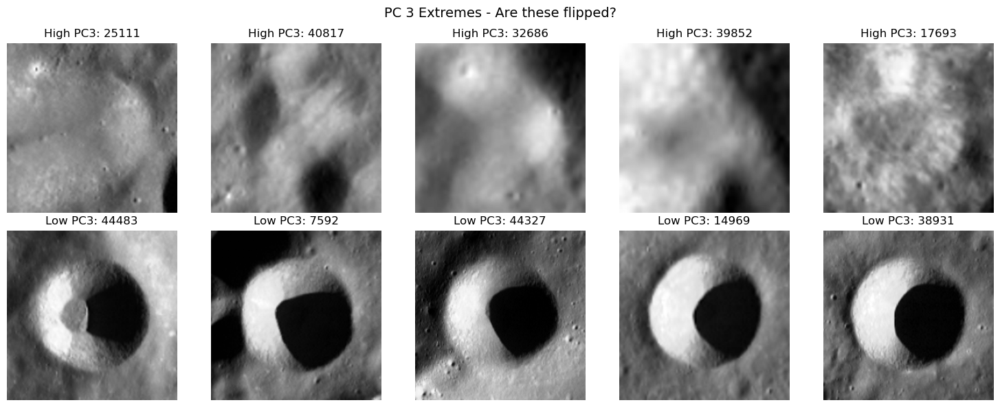

In [9]:
# Check if you have any left-right flipped craters in your data
import numpy as np
import matplotlib.pyplot as plt

# Get original (unstandardized) images
X_original = scaler.inverse_transform(X_scaled)

# Look at some random samples
n_check = 20
random_indices = np.random.choice(X_original.shape[0], size=n_check, replace=False)

fig, axes = plt.subplots(4, 5, figsize=(15, 12))
axes = axes.flatten()

for i, idx in enumerate(random_indices):
    img = X_original[idx].reshape(224, 224)
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(f"Sample {idx}")
    axes[i].axis('off')

plt.suptitle("Random Crater Samples - Check Shadow Direction", fontsize=14)
plt.tight_layout()
plt.show()

# Also check: Look at extreme examples along PC 2
# Images with high positive PC 3 scores vs high negative PC 2 scores
pc3_scores = X_pca[:, 2]  # PC 3 is index 2

n_extremes = 5
high_pc3_pca_idx = np.argsort(pc3_scores)[-n_extremes:]  # Indices into PCA sample
low_pc3_pca_idx = np.argsort(pc3_scores)[:n_extremes]    # Indices into PCA sample

high_pc3_data_idx = pca_sample_indices[high_pc3_pca_idx]
low_pc3_data_idx = pca_sample_indices[low_pc3_pca_idx]

print("\n=== HIGH PC3 CRATERS ===")
print("PCA indices:", high_pc3_pca_idx)
print("Original data indices:", high_pc3_data_idx)

print("\n=== LOW PC3 CRATERS ===")
print("PCA indices:", low_pc3_pca_idx)
print("Original data indices:", low_pc3_data_idx)

fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, idx in enumerate(high_pc3_pca_idx):
    axes[0, i].imshow(X_original[idx].reshape(224, 224), cmap='gray')
    axes[0, i].set_title(f"High PC3: {idx}")
    axes[0, i].axis('off')

for i, idx in enumerate(low_pc3_pca_idx):
    axes[1, i].imshow(X_original[idx].reshape(224, 224), cmap='gray')
    axes[1, i].set_title(f"Low PC3: {idx}")
    axes[1, i].axis('off')

plt.suptitle("PC 3 Extremes - Are these flipped?", fontsize=14)
plt.tight_layout()
plt.show()

Running KMeans with 4 clusters on X_pca shape: (50000, 50)...
✅ KMeans complete!

Cluster distribution:
  Cluster 0: 19513 craters (39.0%)
  Cluster 1: 4706 craters (9.4%)
  Cluster 2: 15200 craters (30.4%)
  Cluster 3: 10581 craters (21.2%)

Computing 2D PCA projection...
[PCA] Total variance explained (PC1+PC2): 68.35%


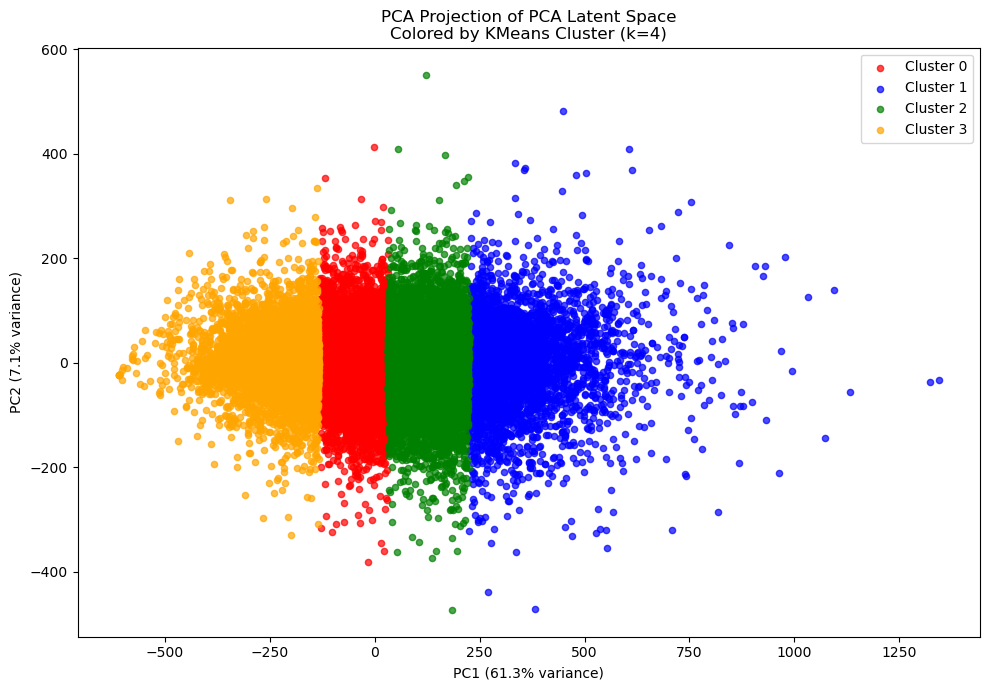


Computing t-SNE projection (this may take a moment)...


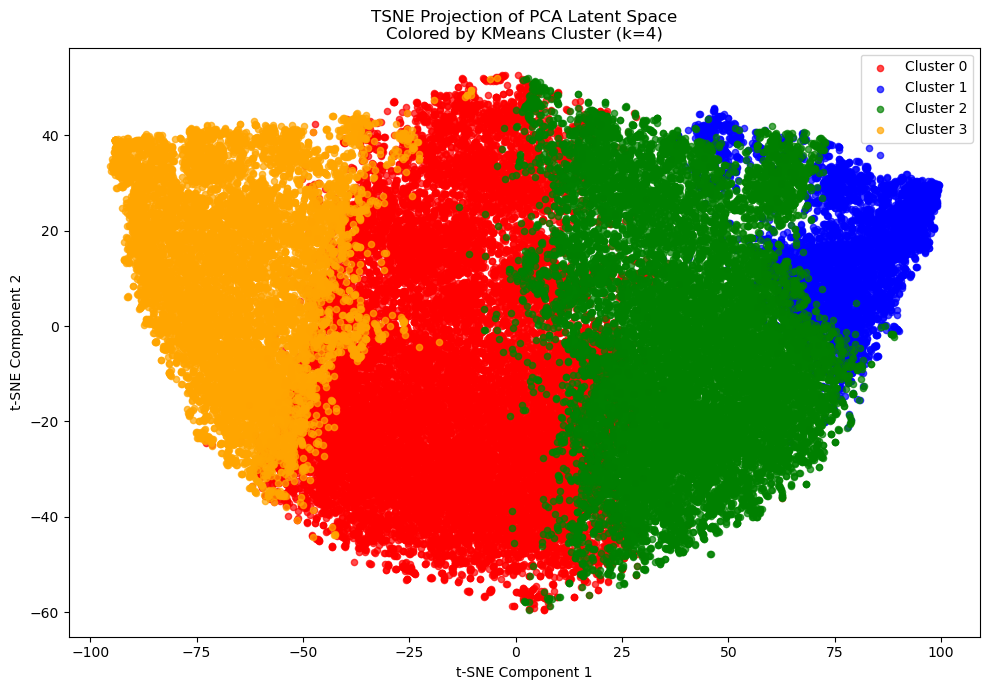


Plotting crater images on PCA projection...
  Subsampling to 500 images for visualization...


/tmp/ipykernel_3782991/2077216014.py:145: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  pil_img = Image.fromarray(img_norm, mode='L')


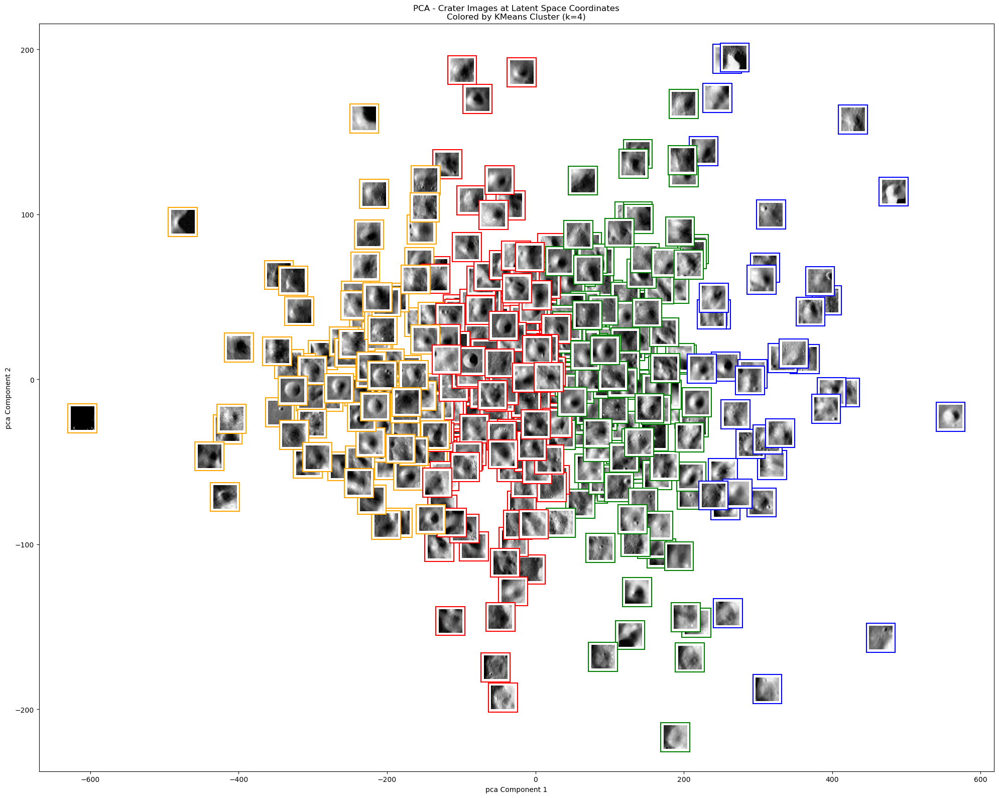


Plotting crater images on t-SNE projection...
  Subsampling to 500 images for visualization...


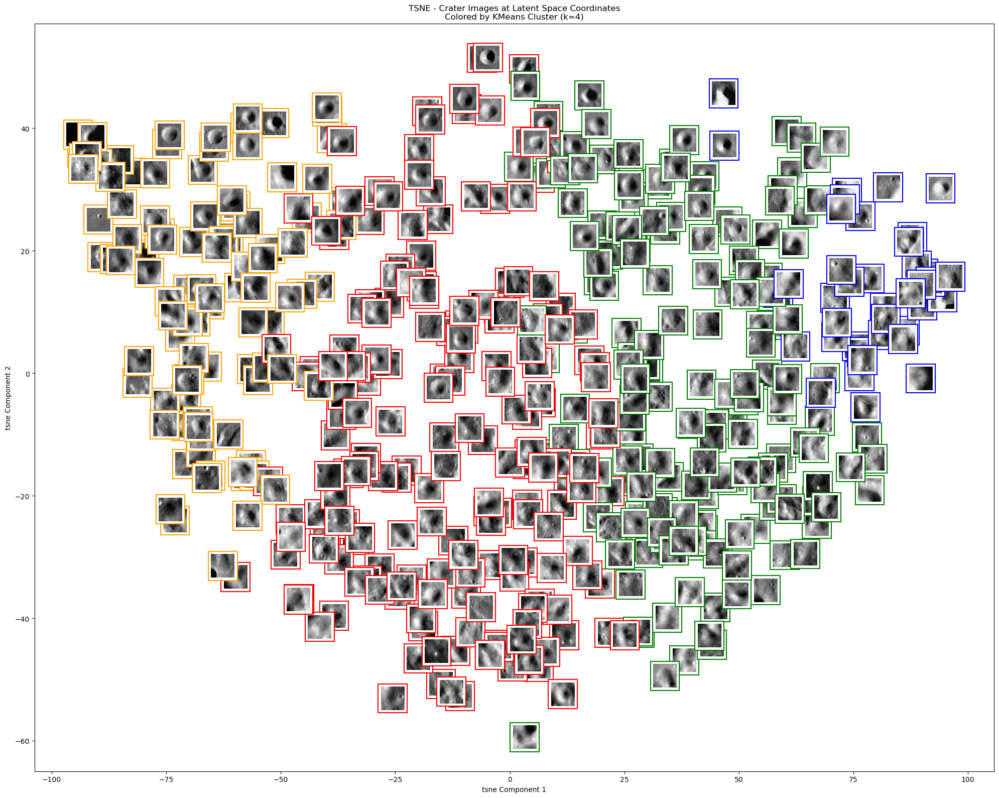


Showing representative craters per cluster...


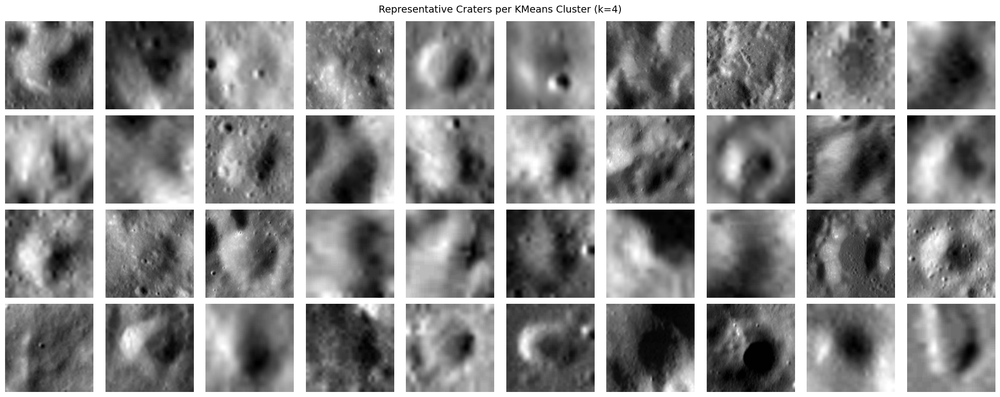


✅ All plots complete!

Summary:
  X_pca shape used for KMeans: (50000, 50)
  Number of clusters: 4
  Cluster distribution:
    Cluster 0: 19513 (39.0%)
    Cluster 1: 4706 (9.4%)
    Cluster 2: 15200 (30.4%)
    Cluster 3: 10581 (21.2%)


In [10]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image
import os

# ====== CONFIGURATION ======
n_clusters = 4
random_seed = 42

# Cluster colors and labels
CLUSTER_COLORS = {
    0: 'red',
    1: 'blue', 
    2: 'green',
    3: 'orange'
}

CLUSTER_LABELS = {
    0: 'Cluster 0',
    1: 'Cluster 1',
    2: 'Cluster 2',
    3: 'Cluster 3'
}

# ====== STEP 1: RUN KMEANS ON X_PCA (50 components) ======
print(f"Running KMeans with {n_clusters} clusters on X_pca shape: {X_pca.shape}...")

kmeans = KMeans(n_clusters=n_clusters, random_state=random_seed, n_init=10)
cluster_labels = kmeans.fit_predict(X_pca)

print(f"✅ KMeans complete!")
print(f"\nCluster distribution:")
for c in range(n_clusters):
    count = (cluster_labels == c).sum()
    print(f"  Cluster {c}: {count} craters ({100*count/len(cluster_labels):.1f}%)")


# ====== STEP 2: PLOT DOTS (PCA and tSNE) ======
def plot_dots_kmeans(coords_2d, cluster_labels, technique, explained_var=None):
    """Plot 2D projection colored by KMeans cluster"""
    
    fig, ax = plt.subplots(figsize=(10, 7))
    
    # Set labels
    if technique == "pca" and explained_var is not None:
        x_label = f"PC1 ({explained_var[0]*100:.1f}% variance)"
        y_label = f"PC2 ({explained_var[1]*100:.1f}% variance)"
        total_var = explained_var.sum() * 100
        print(f"[PCA] Total variance explained (PC1+PC2): {total_var:.2f}%")
    elif technique == "tsne":
        x_label = "t-SNE Component 1"
        y_label = "t-SNE Component 2"
    
    ax.set_title(
        f"{technique.upper()} Projection of PCA Latent Space\n"
        f"Colored by KMeans Cluster (k={n_clusters})"
    )
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    
    # Plot each cluster
    for c in np.unique(cluster_labels):
        mask = cluster_labels == c
        ax.scatter(
            coords_2d[mask, 0],
            coords_2d[mask, 1],
            label=CLUSTER_LABELS.get(c, f"Cluster {c}"),
            c=CLUSTER_COLORS.get(c, 'gray'),
            alpha=0.7,
            s=20,
        )
    
    ax.legend()
    plt.tight_layout()
    plt.show()
    
    return fig


# ====== PCA 2D PROJECTION ======
print("\nComputing 2D PCA projection...")
pca_2d = PCA(n_components=2, random_state=random_seed)
coords_pca = pca_2d.fit_transform(X_pca)
explained_var = pca_2d.explained_variance_ratio_

fig_pca = plot_dots_kmeans(
    coords_pca, 
    cluster_labels, 
    technique="pca", 
    explained_var=explained_var
)

# ====== tSNE 2D PROJECTION ======
print("\nComputing t-SNE projection (this may take a moment)...")
coords_tsne = TSNE(n_components=2, random_state=random_seed).fit_transform(X_pca)

fig_tsne = plot_dots_kmeans(
    coords_tsne,
    cluster_labels,
    technique="tsne"
)


# ====== STEP 3: PLOT IMAGES ======
def plot_imgs_kmeans(coords_2d, X_original, cluster_labels, technique, 
                     n_display=500, zoom=0.15):
    """
    Plot actual crater images at their 2D coordinates, colored border by cluster.
    Uses X_original for images (already in memory, no need for files).
    n_display: max number of images to show (too many = slow)
    """
    # Subsample if too many points
    if len(coords_2d) > n_display:
        print(f"  Subsampling to {n_display} images for visualization...")
        np.random.seed(random_seed)
        idx = np.random.choice(len(coords_2d), size=n_display, replace=False)
        coords_plot = coords_2d[idx]
        labels_plot = cluster_labels[idx]
        images_plot = X_original[idx]
    else:
        coords_plot = coords_2d
        labels_plot = cluster_labels
        images_plot = X_original
    
    fig, ax = plt.subplots(figsize=(20, 16))
    ax.set_title(
        f"{technique.upper()} - Crater Images at Latent Space Coordinates\n"
        f"Colored by KMeans Cluster (k={n_clusters})"
    )
    ax.set_xlabel(f"{technique} Component 1")
    ax.set_ylabel(f"{technique} Component 2")
    
    for i, ((x, y), label) in enumerate(zip(coords_plot, labels_plot)):
        # Get crater image
        img = images_plot[i].reshape(224, 224)
        
        # Normalize image to [0, 255] for display
        img_norm = ((img - img.min()) / (img.max() - img.min() + 1e-8) * 255).astype(np.uint8)
        
        # Create PIL image
        pil_img = Image.fromarray(img_norm, mode='L')
        
        # Create offset image with cluster color border
        im = OffsetImage(pil_img, zoom=zoom, cmap='gray')
        
        # Add colored bounding box by cluster
        ab = AnnotationBbox(
            im, (x, y), 
            frameon=True,
            bboxprops=dict(
                edgecolor=CLUSTER_COLORS.get(label, 'gray'),
                linewidth=1.5
            )
        )
        ax.add_artist(ab)
    
    ax.update_datalim(coords_plot)
    ax.autoscale()
    plt.tight_layout()
    plt.show()
    
    return fig


# ====== PCA IMAGE PLOT ======
print("\nPlotting crater images on PCA projection...")
fig_pca_imgs = plot_imgs_kmeans(
    coords_pca, 
    X_original, 
    cluster_labels, 
    technique="pca",
    n_display=500,
    zoom=0.15
)

# ====== tSNE IMAGE PLOT ======
print("\nPlotting crater images on t-SNE projection...")
fig_tsne_imgs = plot_imgs_kmeans(
    coords_tsne, 
    X_original, 
    cluster_labels, 
    technique="tsne",
    n_display=500,
    zoom=0.15
)


# ====== STEP 4: SHOW REPRESENTATIVE CRATERS PER CLUSTER ======
print("\nShowing representative craters per cluster...")

fig, axes = plt.subplots(n_clusters, 10, figsize=(20, 2*n_clusters))

for c in range(n_clusters):
    cluster_mask = cluster_labels == c
    cluster_indices = np.where(cluster_mask)[0]
    
    # Get 10 random examples from this cluster
    sample_idx = np.random.choice(cluster_indices, size=min(10, len(cluster_indices)), replace=False)
    
    for j, idx in enumerate(sample_idx):
        img = X_original[idx].reshape(224, 224)
        axes[c, j].imshow(img, cmap='gray')
        axes[c, j].axis('off')
        if j == 0:
            axes[c, j].set_ylabel(
                f"Cluster {c}\n({cluster_mask.sum()} craters)", 
                fontsize=10, 
                color=CLUSTER_COLORS[c],
                fontweight='bold'
            )

plt.suptitle(f"Representative Craters per KMeans Cluster (k={n_clusters})", fontsize=14)
plt.tight_layout()
plt.show()

print("\n✅ All plots complete!")
print(f"\nSummary:")
print(f"  X_pca shape used for KMeans: {X_pca.shape}")
print(f"  Number of clusters: {n_clusters}")
print(f"  Cluster distribution:")
for c in range(n_clusters):
    count = (cluster_labels == c).sum()
    print(f"    Cluster {c}: {count} ({100*count/len(cluster_labels):.1f}%)")

Original X_pca shape: (50000, 50)
X_pca without PC1 shape: (50000, 49)
Variance captured by PC1 (removed): 58.95%
Variance remaining (PC2-PC50): 37.28%

Running KMeans with 4 clusters on X_pca_no_pc1...
✅ KMeans complete!

Cluster distribution (no PC1):
  Cluster 0: 25410 craters (50.8%)
  Cluster 1: 10784 craters (21.6%)
  Cluster 2: 6870 craters (13.7%)
  Cluster 3: 6936 craters (13.9%)

Computing 2D PCA projection (on PC2-PC50)...
[PCA] Total variance explained (PC1+PC2): 30.27%


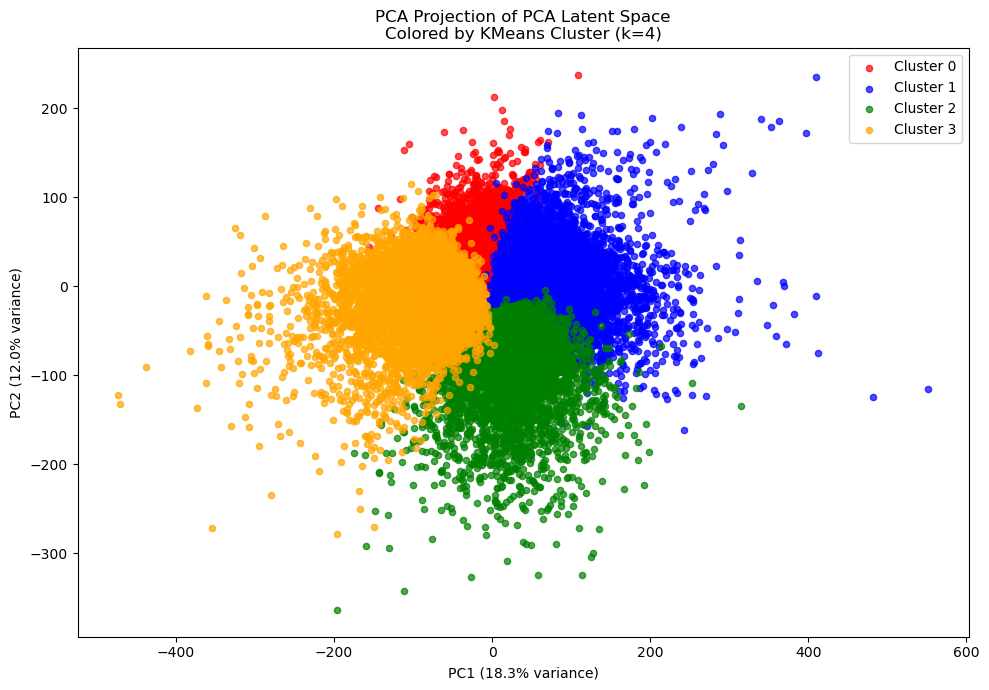


Computing t-SNE projection on PC2-PC50 (this may take a moment)...


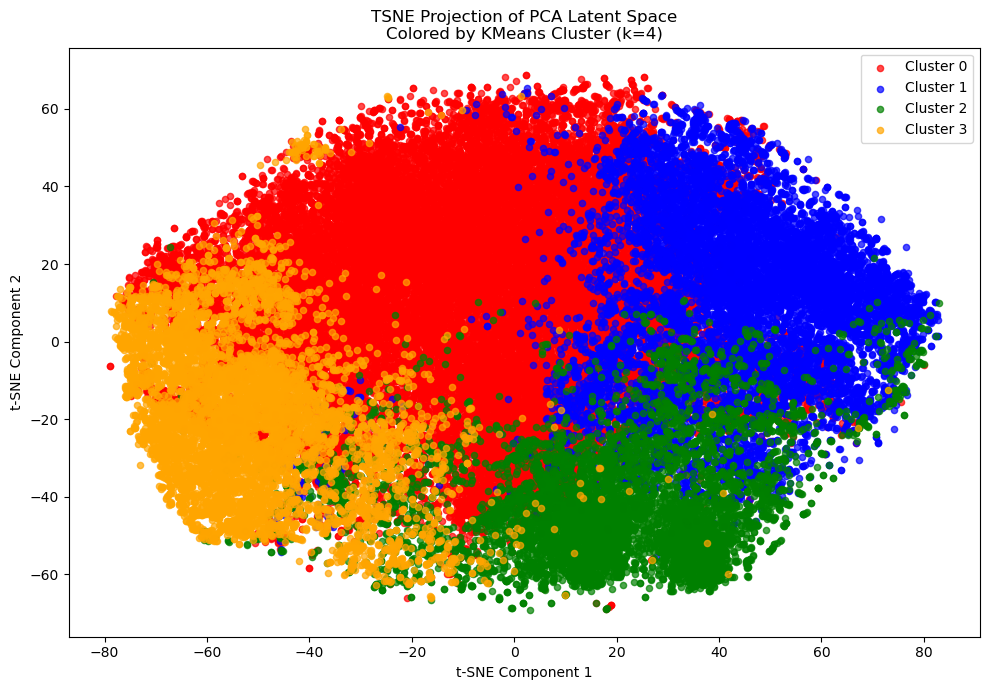


Plotting crater images on PCA projection (no PC1)...
  Subsampling to 500 images for visualization...


/tmp/ipykernel_3782991/2077216014.py:145: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  pil_img = Image.fromarray(img_norm, mode='L')


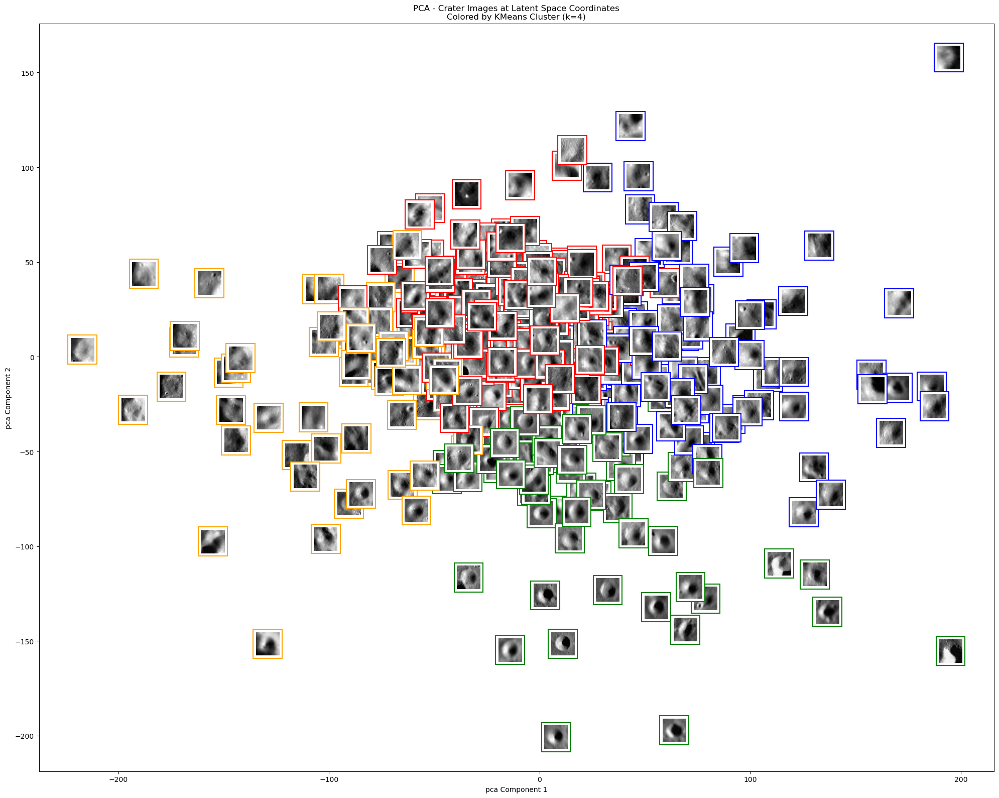


Plotting crater images on t-SNE projection (no PC1)...
  Subsampling to 500 images for visualization...


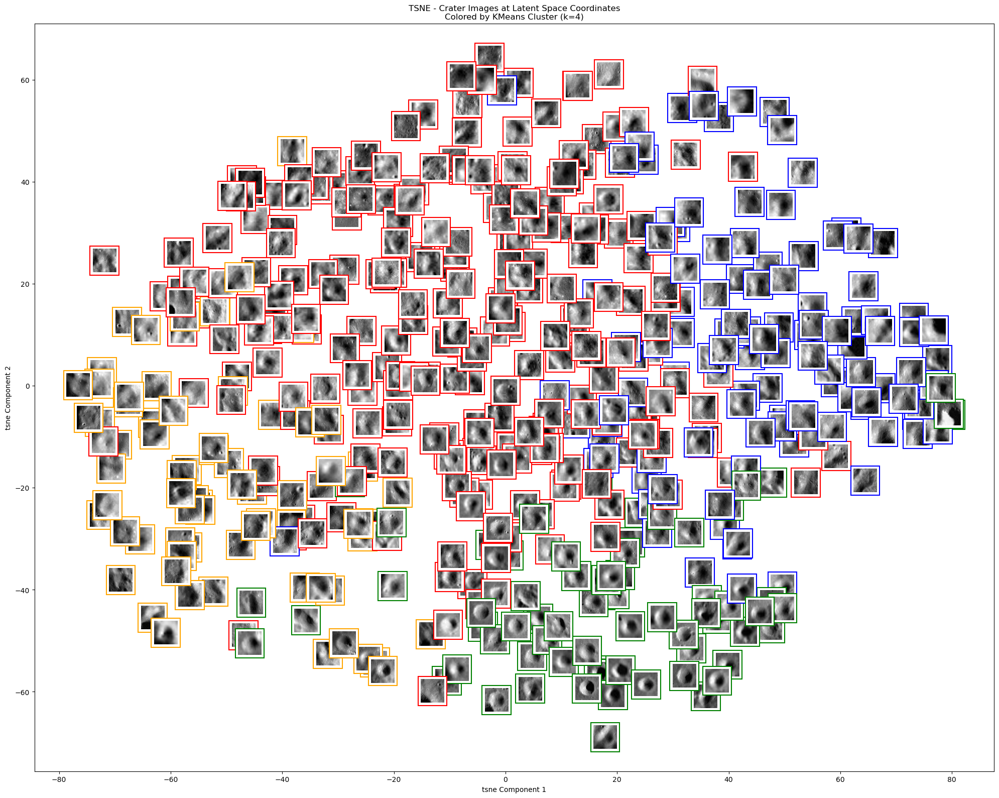


Showing representative craters per cluster (no PC1)...


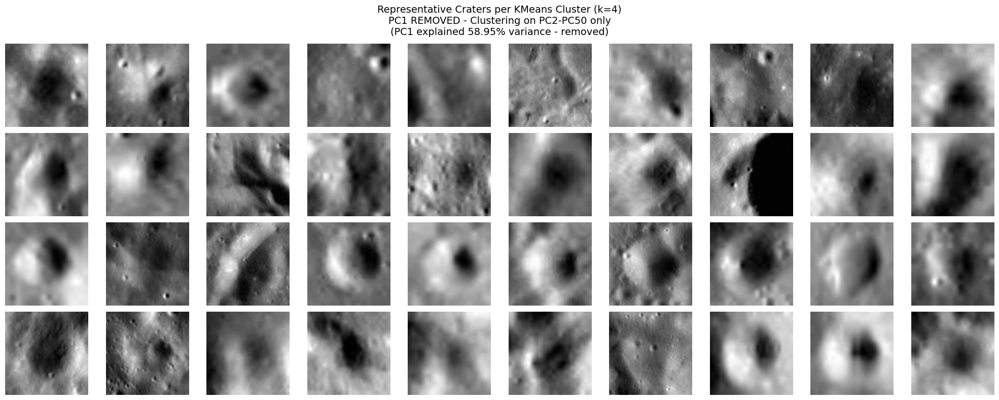


COMPARISON: With PC1 vs Without PC1
PC1 variance removed: 58.95%
Remaining variance (PC2-PC50): 37.28%

Cluster distribution comparison:
Cluster        With PC1  Without PC1
------------------------------------
0             19513 (39.0%)    25410 (50.8%)
1              4706 (9.4%)    10784 (21.6%)
2             15200 (30.4%)     6870 (13.7%)
3             10581 (21.2%)     6936 (13.9%)

✅ All plots complete!


In [11]:
# ====== SAME CODE BUT SKIP FIRST PCA COMPONENT ======

# Remove first component (PC1) from consideration
X_pca_no_pc1 = X_pca[:, 1:]  # Shape: (50000, 49) instead of (50000, 50)

print(f"Original X_pca shape: {X_pca.shape}")
print(f"X_pca without PC1 shape: {X_pca_no_pc1.shape}")
print(f"Variance captured by PC1 (removed): {pca.explained_variance_ratio_[0]*100:.2f}%")
print(f"Variance remaining (PC2-PC50): {pca.explained_variance_ratio_[1:].sum()*100:.2f}%")

# ====== STEP 1: RUN KMEANS ON X_PCA WITHOUT PC1 ======
print(f"\nRunning KMeans with {n_clusters} clusters on X_pca_no_pc1...")

kmeans_no_pc1 = KMeans(n_clusters=n_clusters, random_state=random_seed, n_init=10)
cluster_labels_no_pc1 = kmeans_no_pc1.fit_predict(X_pca_no_pc1)

print(f"✅ KMeans complete!")
print(f"\nCluster distribution (no PC1):")
for c in range(n_clusters):
    count = (cluster_labels_no_pc1 == c).sum()
    print(f"  Cluster {c}: {count} craters ({100*count/len(cluster_labels_no_pc1):.1f}%)")


# ====== STEP 2: PLOT DOTS (PCA and tSNE) ======

# PCA 2D PROJECTION (now on PC2-PC50)
print("\nComputing 2D PCA projection (on PC2-PC50)...")
pca_2d_no_pc1 = PCA(n_components=2, random_state=random_seed)
coords_pca_no_pc1 = pca_2d_no_pc1.fit_transform(X_pca_no_pc1)
explained_var_no_pc1 = pca_2d_no_pc1.explained_variance_ratio_

fig_pca_no_pc1 = plot_dots_kmeans(
    coords_pca_no_pc1,
    cluster_labels_no_pc1,
    technique="pca",
    explained_var=explained_var_no_pc1
)

# tSNE 2D PROJECTION (on PC2-PC50)
print("\nComputing t-SNE projection on PC2-PC50 (this may take a moment)...")
coords_tsne_no_pc1 = TSNE(n_components=2, random_state=random_seed).fit_transform(X_pca_no_pc1)

fig_tsne_no_pc1 = plot_dots_kmeans(
    coords_tsne_no_pc1,
    cluster_labels_no_pc1,
    technique="tsne"
)

# ====== STEP 3: PLOT IMAGES ======

# PCA IMAGE PLOT
print("\nPlotting crater images on PCA projection (no PC1)...")
fig_pca_imgs_no_pc1 = plot_imgs_kmeans(
    coords_pca_no_pc1,
    X_original,
    cluster_labels_no_pc1,
    technique="pca",
    n_display=500,
    zoom=0.15
)

# tSNE IMAGE PLOT
print("\nPlotting crater images on t-SNE projection (no PC1)...")
fig_tsne_imgs_no_pc1 = plot_imgs_kmeans(
    coords_tsne_no_pc1,
    X_original,
    cluster_labels_no_pc1,
    technique="tsne",
    n_display=500,
    zoom=0.15
)

# ====== STEP 4: SHOW REPRESENTATIVE CRATERS PER CLUSTER ======
print("\nShowing representative craters per cluster (no PC1)...")

fig, axes = plt.subplots(n_clusters, 10, figsize=(20, 2*n_clusters))

for c in range(n_clusters):
    cluster_mask = cluster_labels_no_pc1 == c
    cluster_indices = np.where(cluster_mask)[0]
    
    sample_idx = np.random.choice(cluster_indices, size=min(10, len(cluster_indices)), replace=False)
    
    for j, idx in enumerate(sample_idx):
        img = X_original[idx].reshape(224, 224)
        axes[c, j].imshow(img, cmap='gray')
        axes[c, j].axis('off')
        if j == 0:
            axes[c, j].set_ylabel(
                f"Cluster {c}\n({cluster_mask.sum()} craters)", 
                fontsize=10,
                color=CLUSTER_COLORS[c],
                fontweight='bold'
            )

plt.suptitle(
    f"Representative Craters per KMeans Cluster (k={n_clusters})\n"
    f"PC1 REMOVED - Clustering on PC2-PC50 only\n"
    f"(PC1 explained {pca.explained_variance_ratio_[0]*100:.2f}% variance - removed)",
    fontsize=14
)
plt.tight_layout()
plt.show()

# ====== STEP 5: COMPARE WITH/WITHOUT PC1 ======
print("\n" + "="*60)
print("COMPARISON: With PC1 vs Without PC1")
print("="*60)
print(f"PC1 variance removed: {pca.explained_variance_ratio_[0]*100:.2f}%")
print(f"Remaining variance (PC2-PC50): {pca.explained_variance_ratio_[1:].sum()*100:.2f}%")
print(f"\nCluster distribution comparison:")
print(f"{'Cluster':<10} {'With PC1':>12} {'Without PC1':>12}")
print("-" * 36)
for c in range(n_clusters):
    count_with = (cluster_labels == c).sum()
    count_without = (cluster_labels_no_pc1 == c).sum()
    print(f"{c:<10} {count_with:>8} ({100*count_with/len(cluster_labels):.1f}%) "
          f"{count_without:>8} ({100*count_without/len(cluster_labels_no_pc1):.1f}%)")

print("\n✅ All plots complete!")

Detected 1,021,843 craters in the file.


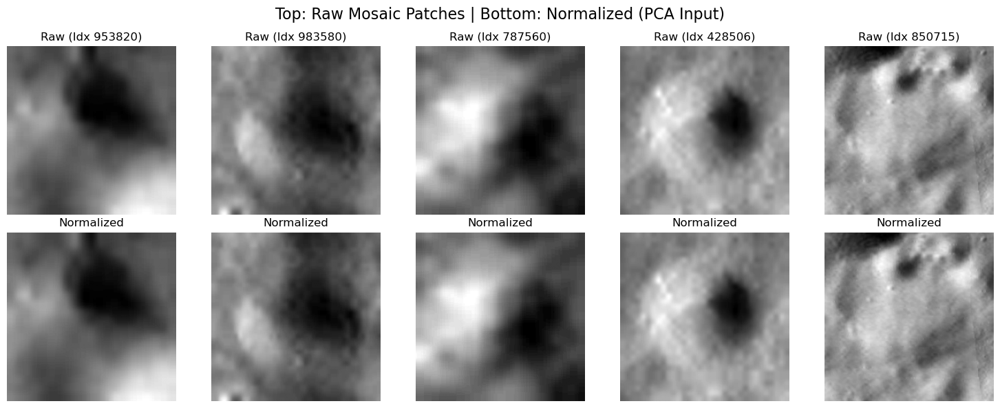

Sample 953820 stats -> Raw Mean: 0.36, Norm Mean: 0.00 (Should be 0)


In [4]:
import numpy as np
import matplotlib.pyplot as plt

# Configuration
DATASET_PATH = 'data/processed_new/cae/craters.npy'
IMAGE_SIZE = 224
SOFT_CONSTANT = 0.1
NUM_SAMPLES = 5

# 1. Load a small slice of data (using memmap for efficiency)
import os

# 1. Manually calculate N (number of craters)
file_size = os.path.getsize(DATASET_PATH)

# A .npy file has a small header (usually 128 bytes), but for 
# a massive file, we can divide the total bytes by the size of one image.
# Each pixel is float32 (4 bytes).
bytes_per_crater = IMAGE_SIZE * IMAGE_SIZE * 1 * 4 
N = file_size // bytes_per_crater

print(f"Detected {N:,} craters in the file.")

# 2. Load with the explicit N instead of -1
data = np.memmap(
    DATASET_PATH, 
    dtype=np.float32, 
    mode="r", 
    shape=(N, 1, IMAGE_SIZE, IMAGE_SIZE)
)

# Pick a few random indices
indices = np.random.choice(len(data), NUM_SAMPLES, replace=False)

fig, axes = plt.subplots(2, NUM_SAMPLES, figsize=(15, 6))

for i, idx in enumerate(indices):
    # Get raw patch
    raw_patch = data[idx].reshape(IMAGE_SIZE, IMAGE_SIZE)
    
    # 2. Apply the same Local Soft Z-Normalization used in your PCA script
    mu = raw_patch.mean()
    sigma = raw_patch.std()
    norm_patch = (raw_patch - mu) / (sigma + SOFT_CONSTANT)
    
    # Plotting Raw
    axes[0, i].imshow(raw_patch, cmap='gray')
    axes[0, i].set_title(f"Raw (Idx {idx})")
    axes[0, i].axis('off')
    
    # Plotting Normalized
    # We use vmin/vmax to see how the 'zero-centering' worked
    axes[1, i].imshow(norm_patch, cmap='grey') 
    axes[1, i].set_title("Normalized")
    axes[1, i].axis('off')

plt.suptitle("Top: Raw Mosaic Patches | Bottom: Normalized (PCA Input)", fontsize=16)
plt.tight_layout()
plt.show()

# Print stats to verify centering
print(f"Sample {indices[0]} stats -> Raw Mean: {raw_patch.mean():.2f}, Norm Mean: {norm_patch.mean():.2f} (Should be 0)")

In [ ]:

# ====== CONFIGURATION ======
DATASET_PATH = 'data/processed_new/cae/craters.npy'
METADATA_PATH = 'data/processed_new/cae/metadata.csv'
LABELS_PATH = 'logs/pca_only/first_component_removed/cluster_labels.npy'
IMAGE_SIZE = 224
SAMPLES_PER_CLUSTER = 10
# ===========================

# 1. Load Data and Metadata
# A .npy file has a small header (usually 128 bytes), but for 
# a massive file, we can divide the total bytes by the size of one image.
# Each pixel is float32 (4 bytes).
bytes_per_crater = IMAGE_SIZE * IMAGE_SIZE * 1 * 4 
N = file_size // bytes_per_crater

print(f"Detected {N:,} craters in the file.")

# 2. Load with the explicit N instead of -1
data = np.memmap(
    DATASET_PATH, 
    dtype=np.float32, 
    mode="r", 
    shape=(N, 1, IMAGE_SIZE, IMAGE_SIZE)
)

labels = np.load(LABELS_PATH)
metadata = pd.read_csv(METADATA_PATH)

n_clusters = len(np.unique(labels))
fig, axes = plt.subplots(n_clusters, SAMPLES_PER_CLUSTER, figsize=(20, 2 * n_clusters))

print(f"Visualizing {n_clusters} clusters...")

for cluster_id in range(n_clusters):
    # Find indices belonging to this cluster
    cluster_indices = np.where(labels == cluster_id)[0]
    
    # Select random samples from the cluster
    sample_indices = np.random.choice(cluster_indices, SAMPLES_PER_CLUSTER, replace=False)
    
    for i, idx in enumerate(sample_indices):
        ax = axes[cluster_id, i]
        
        # Get patch (assuming shape [N, 1, 224, 224])
        img = data[idx, 0].astype(np.float32)
        
        # Apply the SAME normalization used in PCA to see what PCA saw
        mu = img.mean()
        sigma = img.std()
        norm_img = (img - mu) / (sigma + 0.1)
        
        ax.imshow(norm_img, cmap='gray')
        ax.axis('off')
        
        if i == 0:
            ax.set_title(f"Cluster {cluster_id}", loc='left', fontweight='bold')

plt.tight_layout()
plt.show()

Detected 1,021,843 craters in the file.


NameError: name 'pd' is not defined